### From Scratch

| Test Results (accuracy)       | Easy | Difficult |
|--------------------------------------|--------|------------|
| No augmentation                 | 0.33 | 0.10 |
| Using mixup                        | 0.33 | 0.25 |
| Using usual augmentations | 0.83 | 0.60 |
| Using all above                    | 1.00 | 0.65 |

### Imagenet Based

| Test Results (accuracy)       | Easy | Difficult |
|--------------------------------------|--------|------------|
| No augmentation                 | 0.83 | 0.35 |
| Using mixup                        | 1.00 | 0.35 |
| Using usual augmentations | 1.00 | 0.85 |
| Using all above                    | 1.00 | 0.95 |

In [2]:
import warnings
warnings.simplefilter('ignore')
import numpy as np
np.warnings.filterwarnings('ignore')
np.random.seed(1001)

import os
import sys
import shutil
from pathlib import Path

import IPython
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from tqdm import tqdm_notebook
from sklearn.model_selection import StratifiedKFold

matplotlib.style.use('ggplot')
%matplotlib inline

DATAROOT = 'dataset'

datapath = Path(DATAROOT)

from keras.applications.vgg16 import VGG16

from keras.preprocessing import image
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout
from keras import backend as K
import keras

from skimage.io import imread
from scipy.misc import imresize
from keras.preprocessing.image import ImageDataGenerator
from mixup_generator import MixupGenerator
from random_eraser import get_random_eraser
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.callbacks import (EarlyStopping, LearningRateScheduler,
                             ModelCheckpoint, TensorBoard, ReduceLROnPlateau)

### Model
def model_imagenet_x(input_shape, num_classes, weights='imagenet', show_layers=False):
    # create the base pre-trained model
    #base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model = VGG16(weights=weights, include_top=False, input_shape=input_shape)

    # add a global spatial average pooling layer & FC
    x = base_model.output
    x = Flatten()(x)
    x = Dense(256, activation='relu')(x)

    if show_layers:
        for i, layer in enumerate(base_model.layers):
            print(i, layer.name)

    predictions = Dense(num_classes, activation='softmax')(x)

    # this is the model we will train
    model = Model(inputs=base_model.input, outputs=predictions)

    return model, base_model

### Configuration management class
class Config:
    def __init__(self,
                 learning_rate=0.0001,
                 batch_size=16,
                 shape=[224, 224, 3],
                 use_mixup=True,
                 use_augmentations=True,
                verbose=1):
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.shape = shape
        self.verbose = verbose
        self.use_mixup = use_mixup
        self.use_augmentations = use_augmentations

### Dataset distribution utility
def get_class_distribution(y):
    # y_cls can be one of [OH label, index of class, class label name]
    # convert OH to index of class
    y_cls = [np.argmax(one) for one in y] if len(np.array(y).shape) == 2 else y
    # y_cls can be one of [index of class, class label name]
    classset = sorted(list(set(y_cls)))
    sample_distribution = {cur_cls:len([one for one in y_cls if one == cur_cls]) for cur_cls in classset}
    return sample_distribution

def get_class_distribution_list(y, num_classes):
    dist = get_class_distribution(y)
    assert(y[0].__class__ != str) # class index or class OH label only
    list_dist = np.zeros((num_classes))
    for i in range(num_classes):
        if i in dist:
            list_dist[i] = dist[i]
    return list_dist

from imblearn.over_sampling import RandomOverSampler
def balance_class_by_over_sampling(X, y): # Naive: all sample has equal weights
    Xidx = [[xidx] for xidx in range(len(X))]
    y_cls = [np.argmax(one) for one in y]
    classset = sorted(list(set(y_cls)))
    sample_distribution = [len([one for one in y_cls if one == cur_cls]) for cur_cls in classset]
    nsamples = np.max(sample_distribution)
    flat_ratio = {cls:nsamples for cls in classset}
    Xidx_resampled, y_cls_resampled = RandomOverSampler(ratio=flat_ratio, random_state=42).fit_sample(Xidx, y_cls)
    sampled_index = [idx[0] for idx in Xidx_resampled]
    return np.array([X[idx] for idx in sampled_index]), np.array([y[idx] for idx in sampled_index])

### Dataset management class
class LabeledDataset:
    image_suffix = ['.jpg', '.JPG']
    def __init__(self, datapath, shape, batch_size):
        self.datapath = Path(datapath)
        self.shape = shape
        self.batch_size = batch_size
    def load_image(filename, shape, rescale_factor):
        img = imread(filename)
        return imresize(img, shape[:2]) * rescale_factor
    def load_as_image(self):
        # datapath shall contain label/file labeled data files
        train_files = sorted([x for x in self.datapath.glob('*/*') if x.suffix in LabeledDataset.image_suffix])
        self.X_train = np.array([LabeledDataset.load_image(filename, self.shape, rescale_factor=1/255.)
                                    for filename in train_files])
        y_train_label = [filename.parent.name for filename in train_files]
        self.labels = sorted(list(set(y_train_label)))
        self.label2int = {label:i for i, label in enumerate(self.labels)}
        self.y_train = to_categorical([self.label2int[label] for label in y_train_label])
    def split_train_valid(self, test_size=0.2, random_state=42):
        self.cur_X_train, self.cur_X_valid, self.cur_y_train, self.cur_y_valid = train_test_split(
            self.X_train, 
            self.y_train, 
            test_size=test_size,
            random_state=random_state)
        self.cur_X_train, self.cur_y_train = \
            balance_class_by_over_sampling(self.cur_X_train, self.cur_y_train)
    def load_test_as_image(self, test_datapath):
        test_datapath = Path(test_datapath)
        test_files = sorted([x for x in test_datapath.glob('*') if x.suffix in LabeledDataset.image_suffix])
        self.X_test = np.array([LabeledDataset.load_image(filename, self.shape, rescale_factor=1/255.)
                                for filename in test_files])
    def create_test_generator(self, IDG_options={}):
        test_datagen = ImageDataGenerator(**IDG_options)
        y_test_dummy = to_categorical([0 for _ in range(len(self.X_test))])
        self.test_gen = test_datagen.flow(self.X_test, y_test_dummy,
                                          batch_size=len(self.X_test), shuffle=False) ########## self.batch_size
    def create_generator(self, conf, IDG_options={}):
        aug_datagen = ImageDataGenerator(**IDG_options)
        if conf.use_mixup:
            self.train_gen = MixupGenerator(self.cur_X_train, self.cur_y_train, 
                                            alpha=1.0, batch_size=self.batch_size,
                                            datagen=aug_datagen)()
        else:
            self.train_gen = aug_datagen.flow(self.cur_X_train, self.cur_y_train, 
                                              batch_size=self.batch_size)
        plain_datagen = ImageDataGenerator()
        self.valid_gen = plain_datagen.flow(self.cur_X_valid, self.cur_y_valid,
                                                              batch_size=self.batch_size, shuffle=False)
    def train_steps_per_epoch(self):
        return len(self.cur_X_train) // self.batch_size
    def valid_steps_per_epoch(self):
        return len(self.cur_X_valid) // self.batch_size

def reset_generator():
    if conf.use_augmentations:
        IDG_options={'horizontal_flip': True, 'vertical_flip': True,
                     'rotation_range': 40, 'zoom_range': 0.3,
                      'preprocessing_function': get_random_eraser(v_l=np.min(d.X_train),                                                           
                                                    v_h=np.max(d.X_train))}
    else:
        IDG_options={}
    d.create_generator(conf, IDG_options)

Using TensorFlow backend.


In [3]:
conf = Config(batch_size=8, shape=[224, 224, 3], 
              use_mixup=False, use_augmentations=False)

d = LabeledDataset(datapath / 'train', conf.shape, conf.batch_size)
d.load_as_image()
d.split_train_valid()

## From Scratch, Totally No Augmentation

In [3]:
%%time
model, base_model = model_imagenet_x(input_shape=conf.shape, 
                                     num_classes=len(d.labels), weights=None)
model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.Adam(lr=conf.learning_rate),
              metrics=['accuracy'])
callbacks = [
    ModelCheckpoint('model_weights_from_scratch_no_aug.h5', 
                    monitor='val_loss', verbose=1, save_best_only=True),
]
reset_generator()
model.fit_generator(d.train_gen, 
          steps_per_epoch=d.train_steps_per_epoch(),
          epochs=150,
          validation_data=d.valid_gen,
          validation_steps=d.valid_steps_per_epoch(),
          callbacks=callbacks,
          verbose=conf.verbose)

Epoch 1/150
15/15 [==============================] - 6s 417ms/step - loss: 1.7972 - acc: 0.1528 - val_loss: 1.7911 - val_acc: 0.0000e+00

Epoch 00001: val_loss improved from inf to 1.79105, saving model to model_weights_from_scratch_no_aug.h5
Epoch 2/150
15/15 [==============================] - 2s 124ms/step - loss: 1.7918 - acc: 0.1663 - val_loss: 1.7914 - val_acc: 0.0000e+00

Epoch 00002: val_loss did not improve from 1.79105
Epoch 3/150
15/15 [==============================] - 2s 126ms/step - loss: 1.7916 - acc: 0.2000 - val_loss: 1.7878 - val_acc: 0.2500

Epoch 00003: val_loss improved from 1.79105 to 1.78775, saving model to model_weights_from_scratch_no_aug.h5
Epoch 4/150
15/15 [==============================] - 2s 124ms/step - loss: 1.7701 - acc: 0.2581 - val_loss: 1.6649 - val_acc: 0.2500

Epoch 00004: val_loss improved from 1.78775 to 1.66487, saving model to model_weights_from_scratch_no_aug.h5
Epoch 5/150
15/15 [==============================] - 2s 123ms/step - loss: 1.0765 


Epoch 00042: val_loss did not improve from 0.05130
Epoch 43/150
15/15 [==============================] - 2s 125ms/step - loss: 4.5138e-06 - acc: 1.0000 - val_loss: 0.8442 - val_acc: 0.7500

Epoch 00043: val_loss did not improve from 0.05130
Epoch 44/150
15/15 [==============================] - 2s 124ms/step - loss: 1.3987e-06 - acc: 1.0000 - val_loss: 0.8423 - val_acc: 0.7500

Epoch 00044: val_loss did not improve from 0.05130
Epoch 45/150
15/15 [==============================] - 2s 126ms/step - loss: 2.8214e-06 - acc: 1.0000 - val_loss: 0.8424 - val_acc: 0.7500

Epoch 00045: val_loss did not improve from 0.05130
Epoch 46/150
15/15 [==============================] - 2s 123ms/step - loss: 2.4564e-06 - acc: 1.0000 - val_loss: 0.8394 - val_acc: 0.7500

Epoch 00046: val_loss did not improve from 0.05130
Epoch 47/150
15/15 [==============================] - 2s 126ms/step - loss: 2.4121e-06 - acc: 1.0000 - val_loss: 0.8387 - val_acc: 0.7500

Epoch 00047: val_loss did not improve from 0.0513

15/15 [==============================] - 2s 127ms/step - loss: 3.8395e-07 - acc: 1.0000 - val_loss: 0.7760 - val_acc: 0.8750

Epoch 00086: val_loss did not improve from 0.05130
Epoch 87/150
15/15 [==============================] - 2s 125ms/step - loss: 5.3191e-07 - acc: 1.0000 - val_loss: 0.7692 - val_acc: 0.8750

Epoch 00087: val_loss did not improve from 0.05130
Epoch 88/150
15/15 [==============================] - 2s 125ms/step - loss: 4.4272e-07 - acc: 1.0000 - val_loss: 0.7651 - val_acc: 0.8750

Epoch 00088: val_loss did not improve from 0.05130
Epoch 89/150
15/15 [==============================] - 2s 124ms/step - loss: 2.6605e-07 - acc: 1.0000 - val_loss: 0.7628 - val_acc: 0.8750

Epoch 00089: val_loss did not improve from 0.05130
Epoch 90/150
15/15 [==============================] - 2s 127ms/step - loss: 4.7535e-07 - acc: 1.0000 - val_loss: 0.7603 - val_acc: 0.8750

Epoch 00090: val_loss did not improve from 0.05130
Epoch 91/150
15/15 [==============================] - 2s 125ms/

15/15 [==============================] - 2s 125ms/step - loss: 1.6744e-07 - acc: 1.0000 - val_loss: 0.6428 - val_acc: 0.8750

Epoch 00129: val_loss did not improve from 0.05130
Epoch 130/150
15/15 [==============================] - 2s 125ms/step - loss: 1.6247e-07 - acc: 1.0000 - val_loss: 0.6405 - val_acc: 0.8750

Epoch 00130: val_loss did not improve from 0.05130
Epoch 131/150
15/15 [==============================] - 2s 125ms/step - loss: 1.5414e-07 - acc: 1.0000 - val_loss: 0.6396 - val_acc: 0.8750

Epoch 00131: val_loss did not improve from 0.05130
Epoch 132/150
15/15 [==============================] - 2s 125ms/step - loss: 1.5551e-07 - acc: 1.0000 - val_loss: 0.6388 - val_acc: 0.8750

Epoch 00132: val_loss did not improve from 0.05130
Epoch 133/150
15/15 [==============================] - 2s 126ms/step - loss: 1.7484e-07 - acc: 1.0000 - val_loss: 0.6354 - val_acc: 0.8750

Epoch 00133: val_loss did not improve from 0.05130
Epoch 134/150
15/15 [==============================] - 2s 1

## From Scratch By Using Mixup Only

In [4]:
%%time
conf.use_mixup = True

model, base_model = model_imagenet_x(input_shape=conf.shape, 
                                     num_classes=len(d.labels), weights=None)
model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.Adam(lr=conf.learning_rate),
              metrics=['accuracy'])
callbacks = [
    ModelCheckpoint('model_weights_from_scratch_mixup_only.h5', 
                    monitor='val_loss', verbose=1, save_best_only=True),
]
reset_generator()
model.fit_generator(d.train_gen, 
          steps_per_epoch=d.train_steps_per_epoch(),
          epochs=150,
          validation_data=d.valid_gen,
          validation_steps=d.valid_steps_per_epoch(),
          callbacks=callbacks,
          verbose=conf.verbose)

Epoch 1/150
15/15 [==============================] - 3s 203ms/step - loss: 1.7931 - acc: 0.1333 - val_loss: 1.7863 - val_acc: 0.6250

Epoch 00001: val_loss improved from inf to 1.78633, saving model to model_weights_from_scratch_mixup_only.h5
Epoch 2/150
15/15 [==============================] - 2s 130ms/step - loss: 1.7917 - acc: 0.2083 - val_loss: 1.7874 - val_acc: 0.6250

Epoch 00002: val_loss did not improve from 1.78633
Epoch 3/150
15/15 [==============================] - 2s 129ms/step - loss: 1.7930 - acc: 0.2000 - val_loss: 1.6899 - val_acc: 0.6250

Epoch 00003: val_loss improved from 1.78633 to 1.68990, saving model to model_weights_from_scratch_mixup_only.h5
Epoch 4/150
15/15 [==============================] - 2s 129ms/step - loss: 1.7908 - acc: 0.2000 - val_loss: 1.7807 - val_acc: 0.6250

Epoch 00004: val_loss did not improve from 1.68990
Epoch 5/150
15/15 [==============================] - 2s 129ms/step - loss: 1.7542 - acc: 0.2417 - val_loss: 1.5436 - val_acc: 0.5000

Epoch 

15/15 [==============================] - 2s 130ms/step - loss: 0.6100 - acc: 0.9417 - val_loss: 0.9936 - val_acc: 0.6250

Epoch 00042: val_loss did not improve from 0.55534
Epoch 43/150
15/15 [==============================] - 2s 131ms/step - loss: 0.4946 - acc: 0.9583 - val_loss: 0.8896 - val_acc: 0.6250

Epoch 00043: val_loss did not improve from 0.55534
Epoch 44/150
15/15 [==============================] - 2s 132ms/step - loss: 0.5720 - acc: 0.9583 - val_loss: 0.8093 - val_acc: 0.6250

Epoch 00044: val_loss did not improve from 0.55534
Epoch 45/150
15/15 [==============================] - 2s 130ms/step - loss: 0.6217 - acc: 0.9083 - val_loss: 0.9469 - val_acc: 0.6250

Epoch 00045: val_loss did not improve from 0.55534
Epoch 46/150
15/15 [==============================] - 2s 130ms/step - loss: 0.6116 - acc: 0.9167 - val_loss: 0.9591 - val_acc: 0.6250

Epoch 00046: val_loss did not improve from 0.55534
Epoch 47/150
15/15 [==============================] - 2s 130ms/step - loss: 0.5600 

15/15 [==============================] - 2s 132ms/step - loss: 0.4946 - acc: 0.9333 - val_loss: 1.2396 - val_acc: 0.6250

Epoch 00086: val_loss did not improve from 0.55534
Epoch 87/150
15/15 [==============================] - 2s 133ms/step - loss: 0.5071 - acc: 0.8917 - val_loss: 1.3106 - val_acc: 0.6250

Epoch 00087: val_loss did not improve from 0.55534
Epoch 88/150
15/15 [==============================] - 2s 130ms/step - loss: 0.5054 - acc: 0.9333 - val_loss: 1.0689 - val_acc: 0.6250

Epoch 00088: val_loss did not improve from 0.55534
Epoch 89/150
15/15 [==============================] - 2s 130ms/step - loss: 0.4762 - acc: 0.9333 - val_loss: 1.2073 - val_acc: 0.6250

Epoch 00089: val_loss did not improve from 0.55534
Epoch 90/150
15/15 [==============================] - 2s 131ms/step - loss: 0.5336 - acc: 0.9250 - val_loss: 1.0874 - val_acc: 0.6250

Epoch 00090: val_loss did not improve from 0.55534
Epoch 91/150
15/15 [==============================] - 2s 132ms/step - loss: 0.5076 

15/15 [==============================] - 2s 131ms/step - loss: 0.4985 - acc: 0.8917 - val_loss: 0.8891 - val_acc: 0.6250

Epoch 00130: val_loss did not improve from 0.55534
Epoch 131/150
15/15 [==============================] - 2s 130ms/step - loss: 0.5407 - acc: 0.9167 - val_loss: 0.8924 - val_acc: 0.7500

Epoch 00131: val_loss did not improve from 0.55534
Epoch 132/150
15/15 [==============================] - 2s 130ms/step - loss: 0.5232 - acc: 0.9000 - val_loss: 0.9969 - val_acc: 0.6250

Epoch 00132: val_loss did not improve from 0.55534
Epoch 133/150
15/15 [==============================] - 2s 130ms/step - loss: 0.4806 - acc: 0.9250 - val_loss: 1.0496 - val_acc: 0.6250

Epoch 00133: val_loss did not improve from 0.55534
Epoch 134/150
15/15 [==============================] - 2s 132ms/step - loss: 0.5174 - acc: 0.9333 - val_loss: 0.9777 - val_acc: 0.6250

Epoch 00134: val_loss did not improve from 0.55534
Epoch 135/150
15/15 [==============================] - 2s 131ms/step - loss: 0.

# Evaluation

In [6]:
test_expected_preds = np.array([
    [0, 1, 0, 0, 0, 0],
    [0, 0, 0, 0, 1, 0],
    [0, 0, 0, 0, 1, 0],
    [0, 0, 0, 0, 1, 0],
    [0, 0, 0, 0, 0, 1],
    [0, 0, 0, 0, 0, 1],
])
test_difficult_expected_preds = np.array([
    [0, 0.2, 0.2, 0.2, 0.2, 0.2],
    [0, 0.2, 0.2, 0.2, 0.2, 0.2],
    [0, 0.2, 0.2, 0.2, 0.2, 0.2],
    [0, 0.1, 0.0, 0.4, 0.4, 0.1],
    [0, 0.7, 0.0, 0.2, 0.1, 0.1],
    [0, 0.1, 0.0, 0.1, 0.1, 0.7], # 5495
    [0.8, 0, 0, 0, 0, 0.2],
    [0, 0, 1, 0, 0, 0],
    [0, 0, 1, 0, 0, 0],
    [0, 0.1, 0, 0, 0, 0.9],
    [0, 0.3, 0, 0.2, 0.2, 0.4], # 5500
    [0, 0.1, 0, 0.1, 0.7, 0.1],
    [0, 0.1, 0, 0.8, 0.1, 0],
    [0, 0.0, 0, 0.8, 0.2, 0],
    [0, 0, 1, 0, 0, 0],
    [0, 0.8, 0.2, 0, 0, 0], # 5506
    [0, 0.6, 0, 0.4, 0, 0],
    [0, 0.2, 0, 0.6, 0.2, 0],
    [0, 0, 0, 0.2, 0.7, 0.1],
    [0, 0, 0, 0, 0.4, 0.6]
])

def calc_soft_acc(expected, pred):
    pred_idx = np.argmax(pred)
    return 1 if expected[pred_idx] >= 0.2 else 0

def evaluate_test(model, model_weight, test_datapath, expected_preds, test_time_aug_param, 
                  show_detail=True):
    d.load_test_as_image(test_datapath)
    d.create_test_generator(test_time_aug_param)
    model.load_weights(model_weight)
    cur_X_test, cur_y_test = next(d.test_gen)
    preds = model.predict(cur_X_test)
    results = np.argmax(preds, axis=1)
    references = np.argmax(expected_preds, axis=-1)
    #accuracy = np.sum(results == references) / len(preds)
    accuracy = np.sum([calc_soft_acc(expected, pred)
                        for expected, pred in zip(expected_preds, preds)])\
                       / len(preds)
    print('accuracy = ', accuracy)
    #score_all = np.sum(preds * expected_preds) / len(preds)
    #print('prediction score =', score_all)
    if show_detail:
        for no, (img, result, ref, pred) in enumerate(zip(cur_X_test, results, references, preds)):
            plt.imshow(img)
            plt.axis('off')
            plt.title('#%d %s? %s %s' % (no, d.labels[result], 'yes' if result == ref else 'no',
                                         str({d.labels[i]:pred[i] for i in range(len(pred))})))
            plt.show()
    return accuracy

accuracy =  0.333333333333


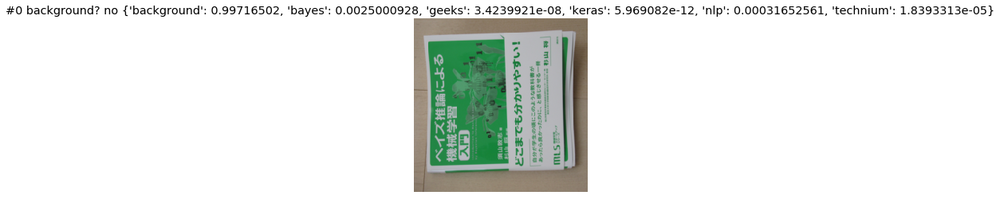

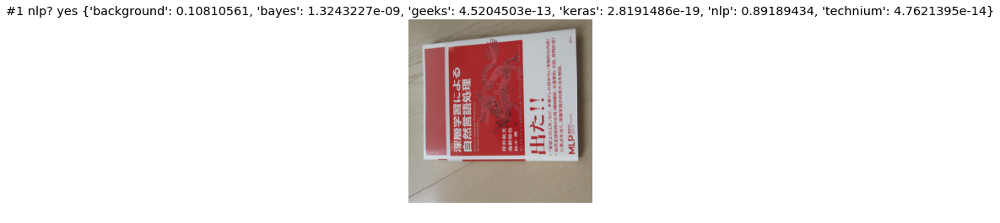

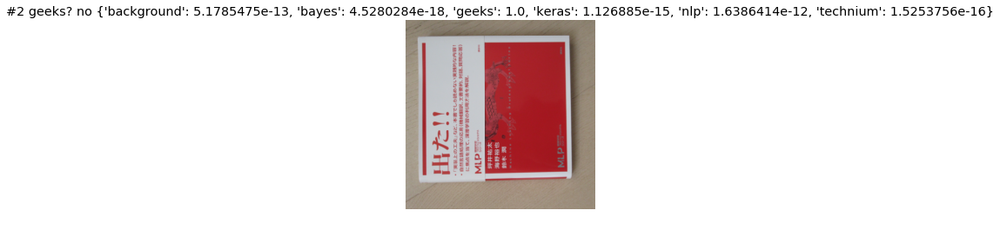

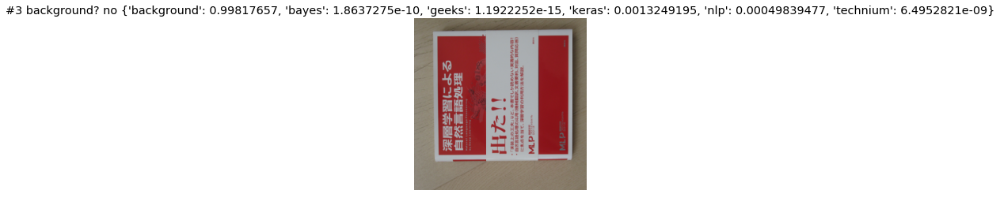

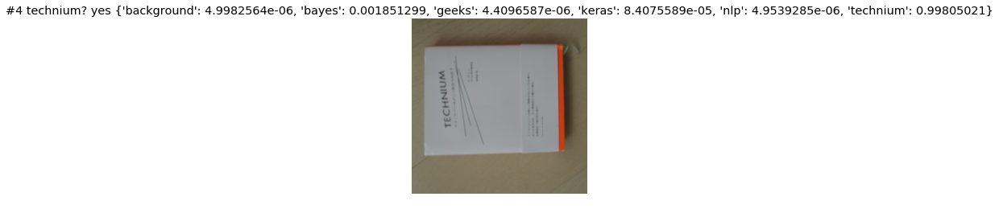

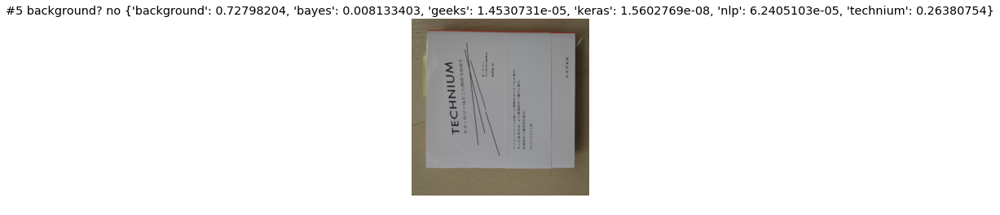

0.33333333333333331

In [6]:
evaluate_test(model, 'model_weights_from_scratch_no_aug.h5', datapath / 'test', test_expected_preds, {})

accuracy =  0.333333333333


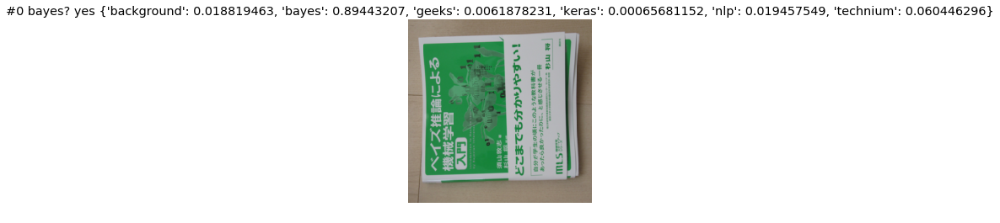

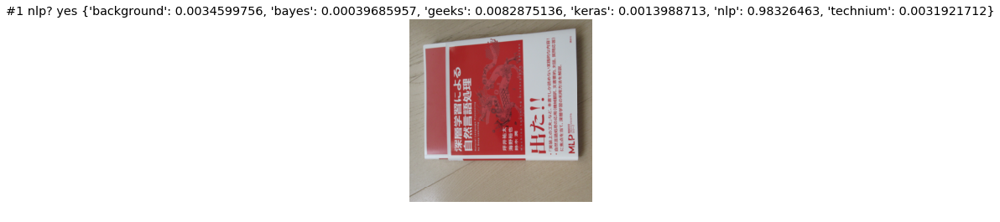

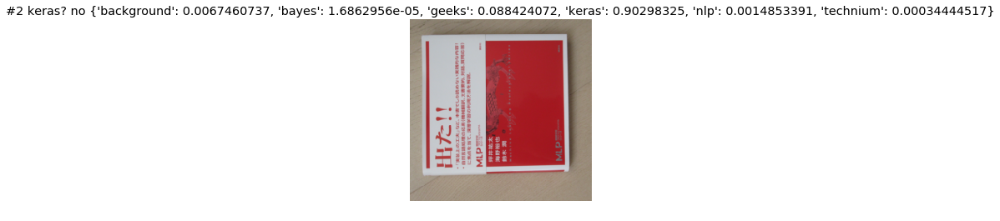

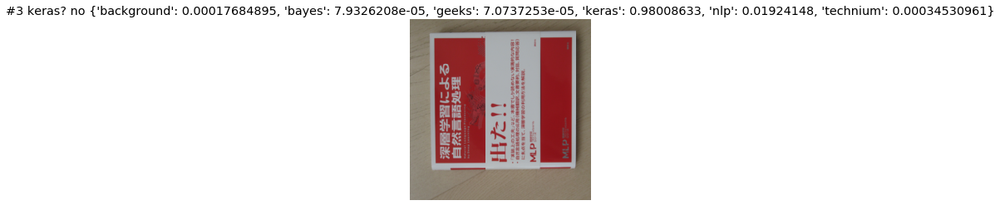

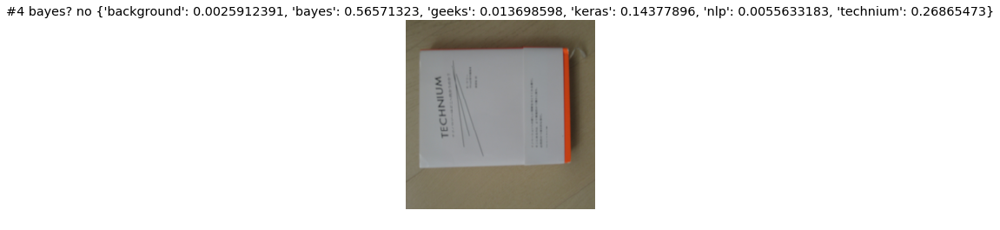

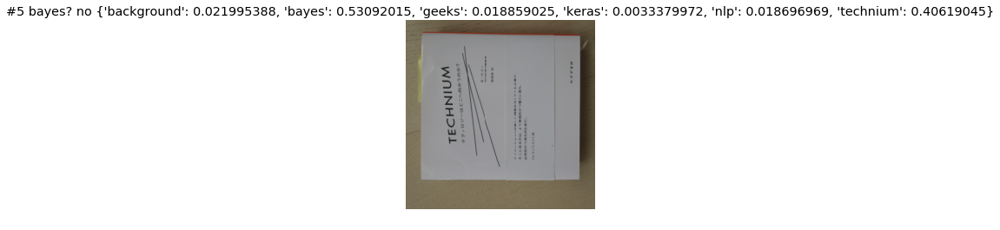

0.33333333333333331

In [7]:
evaluate_test(model, 'model_weights_from_scratch_mixup_only.h5', datapath / 'test', test_expected_preds, {})

In [8]:
evaluate_test(model, 'model_weights_from_scratch_no_aug.h5', datapath / 'test_difficult',
              test_difficult_expected_preds, {}, show_detail=False)
evaluate_test(model, 'model_weights_from_scratch_mixup_only.h5', datapath / 'test_difficult', 
              test_difficult_expected_preds, {}, show_detail=False)

accuracy =  0.1
accuracy =  0.25


0.25

# ImageNet Based

In [9]:
def imagenet_based_evaluation(train_points, model_footer, epochs):
    hists, accuracies = [], []
    for train_point in train_points:
        weight_filename = 'model_weights_%s_imagenet_%s.h5' % (train_point, model_footer)
        callbacks = [
            ModelCheckpoint(weight_filename, monitor='val_loss', verbose=2, save_best_only=True, save_weights_only=True),
            #TensorBoard(log_dir=d.file_with_prefix('logs%s/fold_%d' % (conf.prefix, i)), write_graph=True)
        ]
        reset_generator()

        print('[%s]' % train_point)
        model, base_model = model_imagenet_x(input_shape=conf.shape, num_classes=len(d.labels), weights='imagenet')
        for layer in base_model.layers:
            layer.trainable = False
        model.compile(loss='categorical_crossentropy',
                      optimizer=keras.optimizers.Adam(lr=conf.learning_rate),
                      metrics=['accuracy'])
        model.fit_generator(d.train_gen, 
                  steps_per_epoch=d.train_steps_per_epoch(),
                  epochs=30,
                  validation_data=d.valid_gen,
                  validation_steps=d.valid_steps_per_epoch(),
                  callbacks=callbacks,
                  verbose=conf.verbose)
        print('\n----------------------------------------------')
        print('Roughly trained, now fine tune from', train_point, 'for', epochs, 'epochs.')
        trainable = False
        for layer in base_model.layers:
            if layer.name == train_point:
                trainable = True
            layer.trainable = trainable
        model.load_weights(weight_filename)
        model.compile(loss='categorical_crossentropy',
                      optimizer=keras.optimizers.RMSprop(lr=conf.learning_rate*0.1),
                      metrics=['accuracy'])
        history = model.fit_generator(d.train_gen, 
                  steps_per_epoch=d.train_steps_per_epoch(),
                  epochs=epochs,
                  validation_data=d.valid_gen,
                  validation_steps=d.valid_steps_per_epoch(),
                  callbacks=callbacks,
                  verbose=conf.verbose)

        acc = evaluate_test(model, weight_filename, datapath / 'test_difficult', test_difficult_expected_preds, {}, show_detail=False)
        hists.append(history)
        accuracies.append(acc)
        K.clear_session()
    print()
    return hists, accuracies

## Imagenet Based Without Augmentation

In [10]:
%%time
conf = Config(batch_size=8, shape=[224, 224, 3], 
              use_mixup=False, use_augmentations=False)
imagenet_based_evaluation(train_points=['block4_conv1'], model_footer='no_aug', epochs=50)

[block4_conv1]
Epoch 1/30
15/15 [==============================] - 1s 88ms/step - loss: 1.1365 - acc: 0.6444 - val_loss: 0.5596 - val_acc: 0.8750

Epoch 00001: val_loss improved from inf to 0.55962, saving model to model_weights_block4_conv1_imagenet_no_aug.h5
Epoch 2/30
15/15 [==============================] - 1s 60ms/step - loss: 0.1122 - acc: 0.9917 - val_loss: 0.2893 - val_acc: 0.8750

Epoch 00002: val_loss improved from 0.55962 to 0.28925, saving model to model_weights_block4_conv1_imagenet_no_aug.h5
Epoch 3/30
15/15 [==============================] - 1s 58ms/step - loss: 0.0186 - acc: 1.0000 - val_loss: 0.2648 - val_acc: 0.8750

Epoch 00003: val_loss improved from 0.28925 to 0.26480, saving model to model_weights_block4_conv1_imagenet_no_aug.h5
Epoch 4/30
15/15 [==============================] - 1s 54ms/step - loss: 0.0091 - acc: 1.0000 - val_loss: 0.3111 - val_acc: 0.8750

Epoch 00004: val_loss did not improve from 0.26480
Epoch 5/30
15/15 [==============================] - 1s 5


Epoch 00013: val_loss did not improve from 0.26480
Epoch 14/50
15/15 [==============================] - 1s 79ms/step - loss: 1.1921e-07 - acc: 1.0000 - val_loss: 0.4457 - val_acc: 0.8750

Epoch 00014: val_loss did not improve from 0.26480
Epoch 15/50
15/15 [==============================] - 1s 80ms/step - loss: 1.1921e-07 - acc: 1.0000 - val_loss: 0.4710 - val_acc: 0.8750

Epoch 00015: val_loss did not improve from 0.26480
Epoch 16/50
15/15 [==============================] - 1s 79ms/step - loss: 1.1921e-07 - acc: 1.0000 - val_loss: 0.4754 - val_acc: 0.8750

Epoch 00016: val_loss did not improve from 0.26480
Epoch 17/50
15/15 [==============================] - 1s 77ms/step - loss: 1.1921e-07 - acc: 1.0000 - val_loss: 0.4758 - val_acc: 0.8750

Epoch 00017: val_loss did not improve from 0.26480
Epoch 18/50
15/15 [==============================] - 1s 78ms/step - loss: 1.1921e-07 - acc: 1.0000 - val_loss: 0.4761 - val_acc: 0.8750

Epoch 00018: val_loss did not improve from 0.26480
Epoch 19

## Imagenet Based Only With Mixup

In [11]:
%%time
conf = Config(batch_size=8, shape=[224, 224, 3], 
              use_mixup=True, use_augmentations=False)
imagenet_based_evaluation(train_points=['block4_conv1'], model_footer='mixup_only', epochs=50)

[block4_conv1]
Epoch 1/30
15/15 [==============================] - 1s 86ms/step - loss: 1.4948 - acc: 0.5417 - val_loss: 0.6128 - val_acc: 0.8750

Epoch 00001: val_loss improved from inf to 0.61282, saving model to model_weights_block4_conv1_imagenet_mixup_only.h5
Epoch 2/30
15/15 [==============================] - 1s 64ms/step - loss: 0.8633 - acc: 0.9000 - val_loss: 0.3088 - val_acc: 0.8750

Epoch 00002: val_loss improved from 0.61282 to 0.30876, saving model to model_weights_block4_conv1_imagenet_mixup_only.h5
Epoch 3/30
15/15 [==============================] - 1s 60ms/step - loss: 0.7920 - acc: 0.9167 - val_loss: 0.3019 - val_acc: 0.8750

Epoch 00003: val_loss improved from 0.30876 to 0.30188, saving model to model_weights_block4_conv1_imagenet_mixup_only.h5
Epoch 4/30
15/15 [==============================] - 1s 59ms/step - loss: 0.7770 - acc: 0.9250 - val_loss: 0.4027 - val_acc: 1.0000

Epoch 00004: val_loss did not improve from 0.30188
Epoch 5/30
15/15 [==========================

15/15 [==============================] - 1s 83ms/step - loss: 0.6173 - acc: 0.9250 - val_loss: 0.2451 - val_acc: 0.8750

Epoch 00013: val_loss did not improve from 0.23216
Epoch 14/50
15/15 [==============================] - 1s 82ms/step - loss: 0.6058 - acc: 0.9250 - val_loss: 0.3131 - val_acc: 0.8750

Epoch 00014: val_loss did not improve from 0.23216
Epoch 15/50
15/15 [==============================] - 1s 83ms/step - loss: 0.5891 - acc: 0.9167 - val_loss: 0.2174 - val_acc: 0.8750

Epoch 00015: val_loss improved from 0.23216 to 0.21741, saving model to model_weights_block4_conv1_imagenet_mixup_only.h5
Epoch 16/50
15/15 [==============================] - 1s 82ms/step - loss: 0.5896 - acc: 0.9333 - val_loss: 0.3063 - val_acc: 0.8750

Epoch 00016: val_loss did not improve from 0.21741
Epoch 17/50
15/15 [==============================] - 1s 83ms/step - loss: 0.6358 - acc: 0.9083 - val_loss: 0.3500 - val_acc: 0.8750

Epoch 00017: val_loss did not improve from 0.21741
Epoch 18/50
15/15 [==

In [12]:
model, base_model = model_imagenet_x(input_shape=conf.shape, num_classes=len(d.labels), weights='imagenet')
evaluate_test(model, 'model_weights_block4_conv1_imagenet_no_aug.h5',
              datapath / 'test', test_expected_preds, {}, show_detail=False)
evaluate_test(model, 'model_weights_block4_conv1_imagenet_mixup_only.h5',
              datapath / 'test', test_expected_preds, {}, show_detail=False)

accuracy =  0.833333333333
accuracy =  1.0


1.0

# Visualization

In [7]:
import cv2

def imshow_friendly(img):
    img_temp = img - np.min(img)
    img_temp = img_temp/np.max(img_temp)
    friendly = np.uint8(255 * img_temp)
    return friendly

def visualize_cam(model, model_weight, test_file_index, datapath, 
                  expected_preds, test_time_aug_param={}):
    d.load_test_as_image(datapath)
    d.create_test_generator(test_time_aug_param)
    model.load_weights(model_weight)
    last_conv_layer = model.get_layer('block5_conv3')
    cur_X_test, cur_y_test = next(d.test_gen)
    x = np.array([cur_X_test[test_file_index]])
    preds = model.predict(x)
    targ_class = np.argmax(preds[0])
    result = calc_soft_acc(expected_preds[test_file_index], preds[0])

    output = model.output[:, targ_class]
    grads = K.gradients(output, last_conv_layer.output)[0]
    pooled_grads = K.mean(grads, axis=(0, 1, 2))
    iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
    pooled_grads_value, conv_layer_output_value = iterate([x])
    for i in range(int(last_conv_layer.output.shape[3])):
        conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    heatmap = np.mean(conv_layer_output_value, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    
    img = next(d.test_gen)[0][test_file_index]
    fig = plt.figure(figsize=(10, 5), dpi=100)
    ax = fig.add_subplot(131)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    ax.set_axis_off()
    ax.matshow(heatmap)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed = ((heatmap*0.5/np.max(heatmap) + img)) / 1.5
    ax = fig.add_subplot(132)
    ax.set_axis_off()
    ax.imshow(imshow_friendly(superimposed))
    ax.set_title('%s? %s' % (d.labels[targ_class], 'yes' if result == 1 else 'no'), fontsize=12)
    ax = fig.add_subplot(133)
    ax.set_axis_off()
    ax.imshow(imshow_friendly(img))
    fig.show()

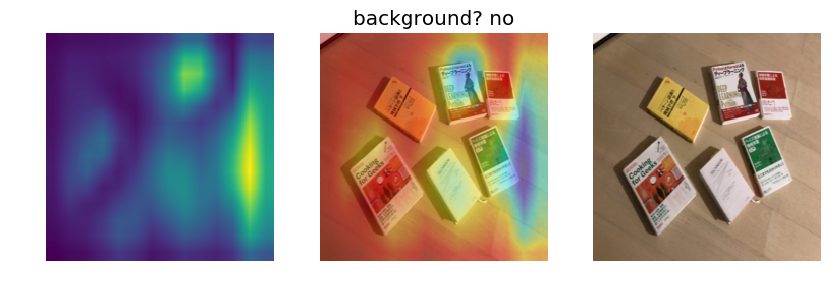

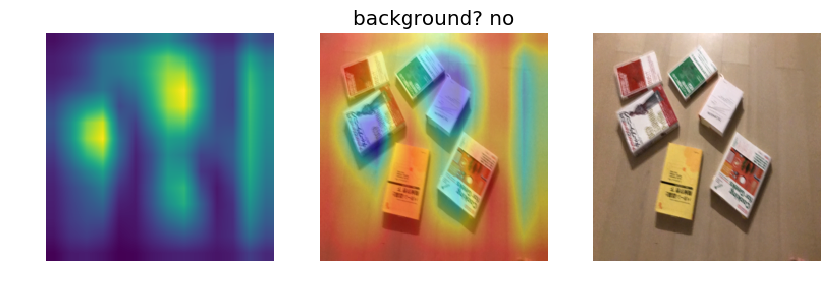

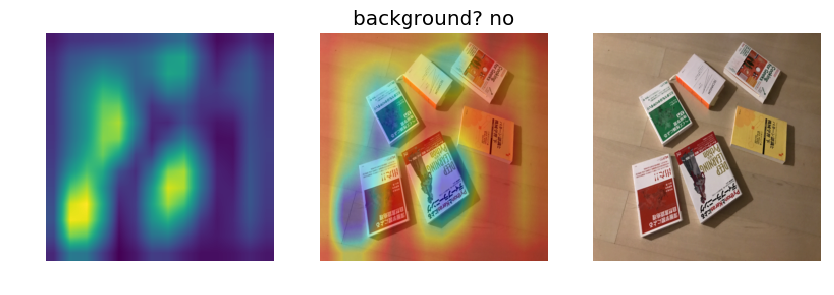

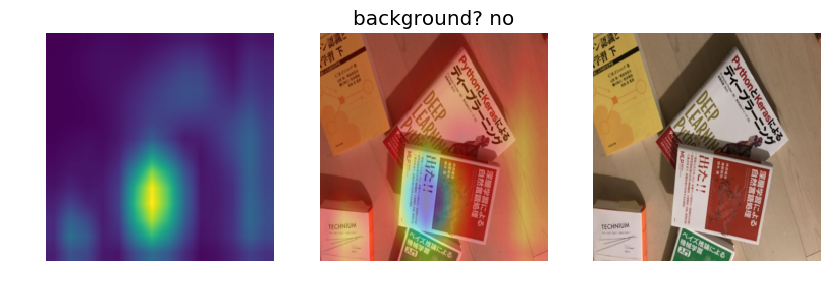

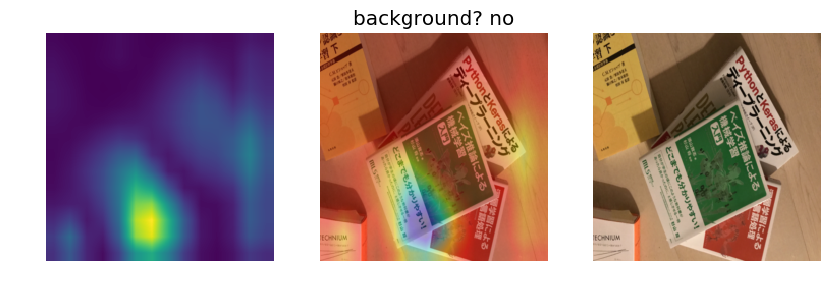

...

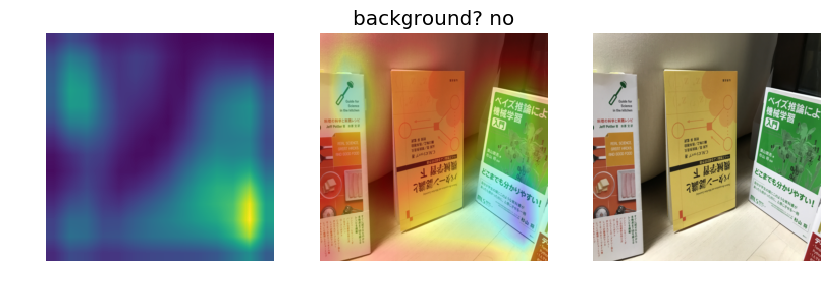

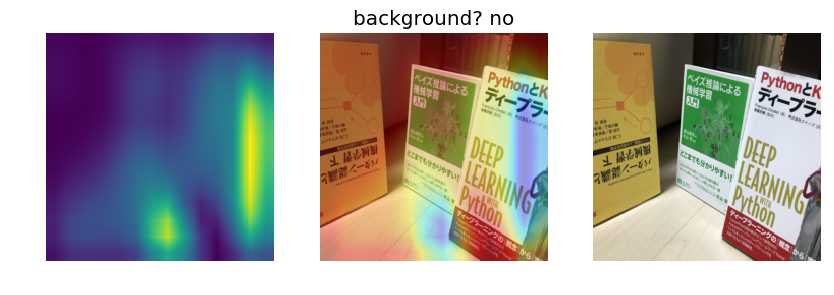

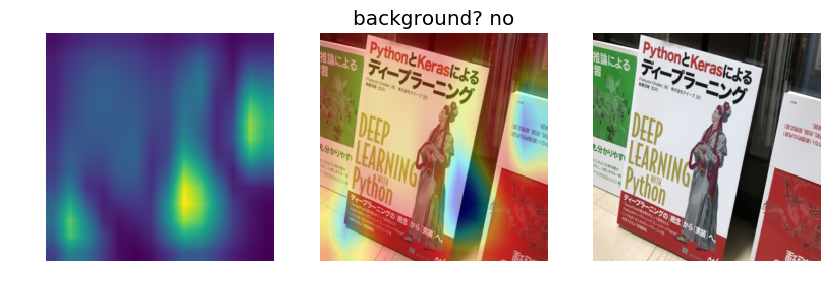

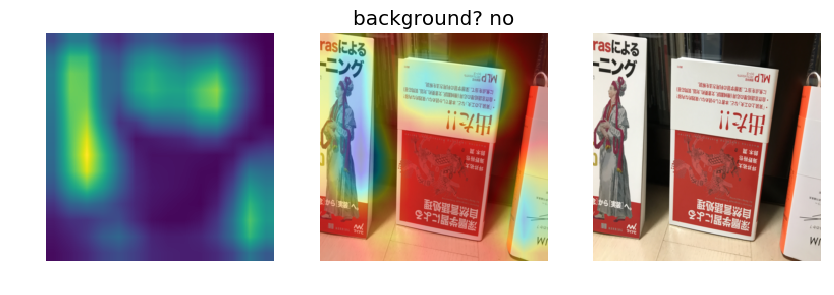

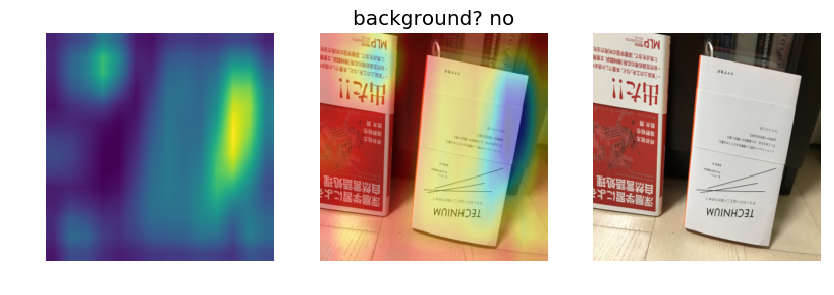

In [9]:
model, base_model = model_imagenet_x(input_shape=conf.shape, num_classes=len(d.labels), weights='imagenet')
for i in range(len(test_difficult_expected_preds)):
    visualize_cam(model, 'model_weights_from_scratch_no_aug.h5', i, datapath / 'test_difficult',
                  test_difficult_expected_preds)

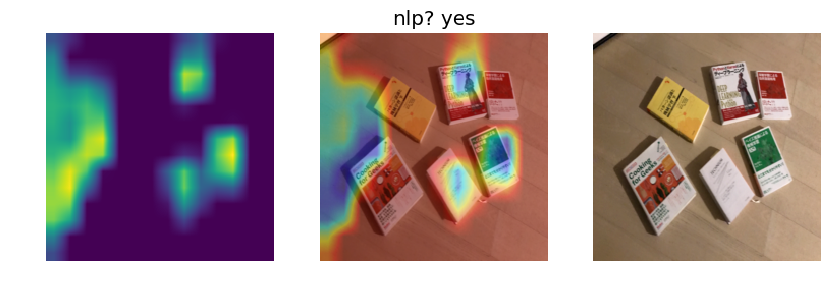

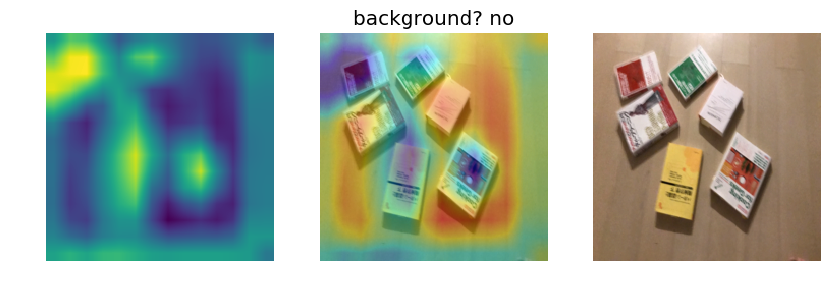

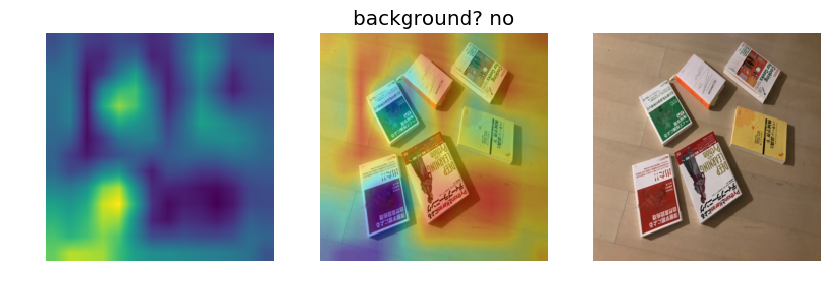

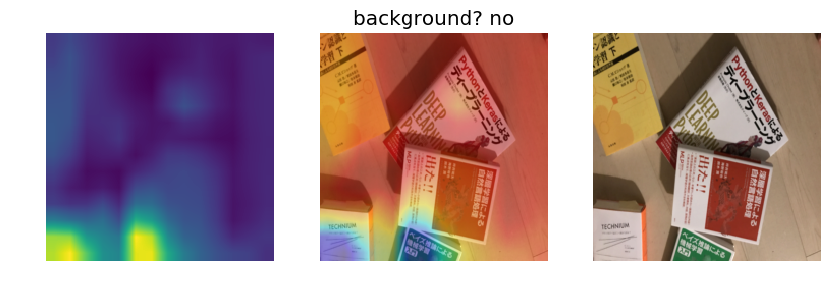

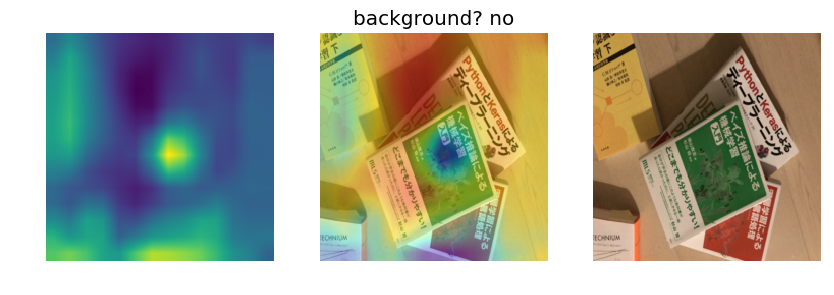

...

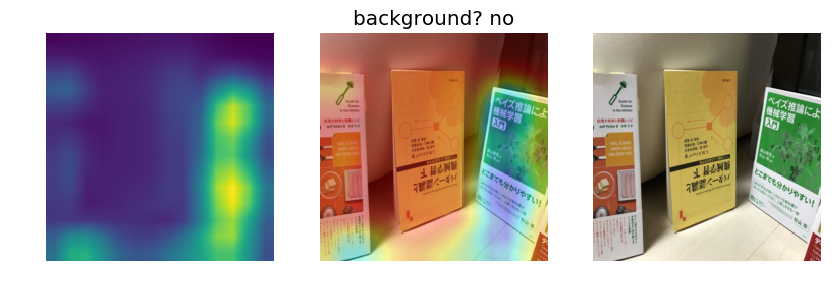

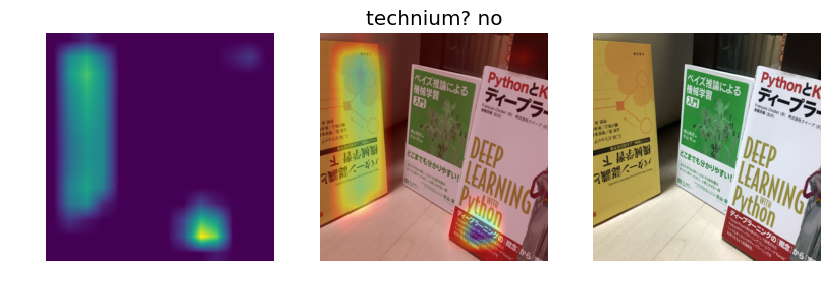

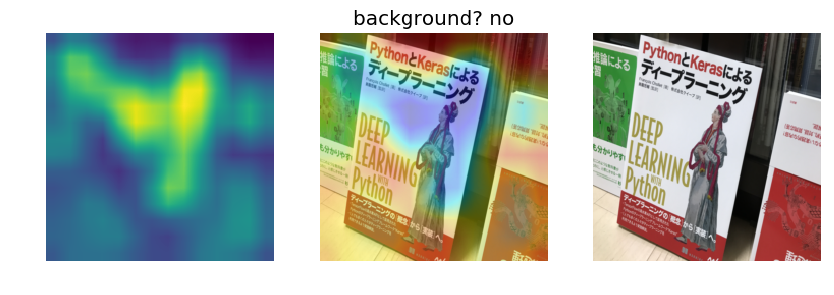

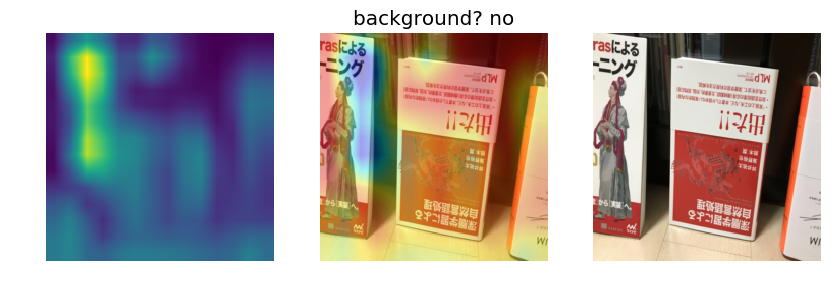

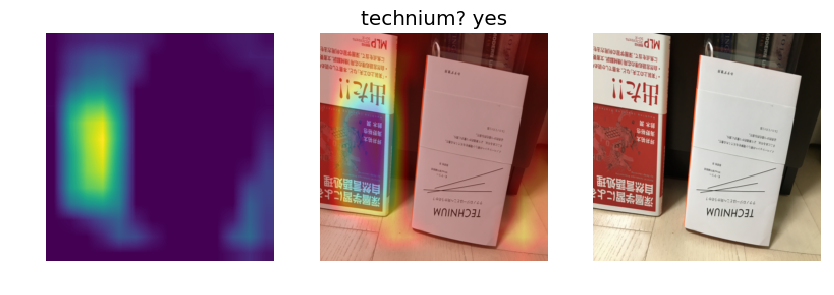

In [11]:
for i in range(len(test_difficult_expected_preds)):
    visualize_cam(model, 'model_weights_from_scratch_mixup_only.h5', i, datapath / 'test_difficult',
                  test_difficult_expected_preds)